<a href="https://colab.research.google.com/github/CelikAbdullah/deep-learning-notebooks/blob/main/Deep%20Reinforcement%20Learning/Actor-Critic/PPO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Libraries

In [71]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
import gym
import time
from itertools import count
import torch.multiprocessing as mp

In [72]:
!pip install -q swig

In [73]:
!pip install -q gym[box2d]

# Replay Buffer

In [74]:
class ReplayBuffer():
  def __init__(self,
               state_dim,
               gamma,
               tau,
               n_workers,
               max_episodes,
               max_episode_steps):

    assert max_episodes >= n_workers

    self.state_dim = state_dim
    self.gamma = gamma
    self.tau = tau
    self.n_workers = n_workers
    self.max_episodes = max_episodes
    self.max_episode_steps = max_episode_steps

    self._truncated_fn = np.vectorize(lambda x: 'TimeLimit.truncated' in x and x['TimeLimit.truncated'])
    self.discounts = np.logspace(0, max_episode_steps+1, num=max_episode_steps+1, base=gamma, endpoint=False, dtype=np.float128)
    self.tau_discounts = np.logspace(0, max_episode_steps+1, num=max_episode_steps+1, base=gamma*tau, endpoint=False, dtype=np.float128)

    device = 'cpu'
    if torch.cuda.is_available():
      device = 'cuda:0'
    self.device = torch.device(device)

    self.clear()

  def clear(self):
    self.states_mem = np.empty(shape=np.concatenate(((self.max_episodes, self.max_episode_steps), self.state_dim)), dtype=np.float64)
    self.states_mem[:] = np.nan
    self.actions_mem = np.empty(shape=(self.max_episodes, self.max_episode_steps), dtype=np.uint8)
    self.actions_mem[:] = 0

    self.returns_mem = np.empty(shape=(self.max_episodes,self.max_episode_steps), dtype=np.float32)
    self.returns_mem[:] = np.nan

    self.gaes_mem = np.empty(shape=(self.max_episodes, self.max_episode_steps), dtype=np.float32)
    self.gaes_mem[:] = np.nan

    self.logpas_mem = np.empty(shape=(self.max_episodes, self.max_episode_steps), dtype=np.float32)
    self.logpas_mem[:] = np.nan

    self.episode_steps = np.zeros(shape=(self.max_episodes), dtype=np.uint16)
    self.episode_reward = np.zeros(shape=(self.max_episodes), dtype=np.float32)


    self.current_ep_idxs = np.arange(self.n_workers, dtype=np.uint16)

  def fill(self, envs, policy_model, value_model):
    states = envs.reset()

    worker_rewards = np.zeros(shape=(self.n_workers, self.max_episode_steps), dtype=np.float32)
    worker_steps = np.zeros(shape=(self.n_workers), dtype=np.uint16)

    buffer_full = False
    while not buffer_full and len(self.episode_steps[self.episode_steps > 0]) < self.max_episodes/2:
      with torch.no_grad():
        actions, logpas, are_exploratory = policy_model.np_pass(states)
        values = value_model(states)

      next_states, rewards, terminals, infos = envs.step(actions)
      self.states_mem[self.current_ep_idxs, worker_steps] = states
      self.actions_mem[self.current_ep_idxs, worker_steps] = actions
      self.logpas_mem[self.current_ep_idxs, worker_steps] = logpas


      worker_rewards[np.arange(self.n_workers), worker_steps] = rewards

      for w_idx in range(self.n_workers):
        if worker_steps[w_idx] + 1 == self.max_episode_steps:
          terminals[w_idx] = 1
          infos[w_idx]['TimeLimit.truncated'] = True

      if terminals.sum():
        idx_terminals = np.flatnonzero(terminals)
        next_values = np.zeros(shape=(self.n_workers))
        truncated = self._truncated_fn(infos)
        if truncated.sum():
          idx_truncated = np.flatnonzero(truncated)
          with torch.no_grad():
            next_values[idx_truncated] = value_model(next_states[idx_truncated]).cpu().numpy()

      states = next_states
      worker_steps += 1

      if terminals.sum():
        new_states = envs.reset(ranks=idx_terminals)
        states[idx_terminals] = new_states

        for w_idx in range(self.n_workers):
          if w_idx not in idx_terminals:
            continue

          e_idx = self.current_ep_idxs[w_idx]
          T = worker_steps[w_idx]
          self.episode_steps[e_idx] = T
          self.episode_reward[e_idx] = worker_rewards[w_idx, :T].sum()

          ep_rewards = np.concatenate((worker_rewards[w_idx, :T], [next_values[w_idx]]))
          ep_discounts = self.discounts[:T+1]
          ep_returns = np.array([np.sum(ep_discounts[:T+1-t] * ep_rewards[t:]) for t in range(T)])

          self.returns_mem[e_idx, :T] = ep_returns
          ep_states = self.states_mem[e_idx, :T]
          with torch.no_grad():
            ep_values = torch.cat((value_model(ep_states),
                                   torch.tensor([next_values[w_idx]],
                                                device=value_model.device,
                                                dtype=torch.float32)))
          np_ep_values = ep_values.view(-1).cpu().numpy()
          ep_tau_discounts = self.tau_discounts[:T]
          deltas = ep_rewards[:-1] + self.gamma * np_ep_values[1:] - np_ep_values[:-1]
          gaes = np.array([np.sum(self.tau_discounts[:T-t] * deltas[t:]) for t in range(T)])
          self.gaes_mem[e_idx, :T] = gaes


          worker_rewards[w_idx, :] = 0
          worker_steps[w_idx] = 0


          new_ep_id = max(self.current_ep_idxs) + 1
          if new_ep_id >= self.max_episodes:
            buffer_full = True
            break

          self.current_ep_idxs[w_idx] = new_ep_id

    ep_idxs = self.episode_steps > 0
    ep_t = self.episode_steps[ep_idxs]

    self.states_mem = [row[:ep_t[i]] for i, row in enumerate(self.states_mem[ep_idxs])]
    self.states_mem = np.concatenate(self.states_mem)
    self.actions_mem = [row[:ep_t[i]] for i, row in enumerate(self.actions_mem[ep_idxs])]
    self.actions_mem = np.concatenate(self.actions_mem)
    self.returns_mem = [row[:ep_t[i]] for i, row in enumerate(self.returns_mem[ep_idxs])]
    self.returns_mem = torch.tensor(np.concatenate(self.returns_mem),
                                    device=value_model.device)
    self.gaes_mem = [row[:ep_t[i]] for i, row in enumerate(self.gaes_mem[ep_idxs])]
    self.gaes_mem = torch.tensor(np.concatenate(self.gaes_mem),
                                 device=value_model.device)
    self.logpas_mem = [row[:ep_t[i]] for i, row in enumerate(self.logpas_mem[ep_idxs])]
    self.logpas_mem = torch.tensor(np.concatenate(self.logpas_mem),
                                   device=value_model.device)

    return ep_t

  def get_stacks(self):
    return (self.states_mem,
            self.actions_mem,
            self.returns_mem,
            self.gaes_mem, self.logpas_mem)

  def __len__(self):
    return self.episode_steps[self.episode_steps > 0].sum()

# Policy Network

In [75]:
class PolicyNetwork(nn.Module):
  def __init__(self,
               input_dim,
               output_dim,
               hidden_dims=(32,32),
               activation_fc=F.relu):
    super(PolicyNetwork, self).__init__()
    self.activation_fc = activation_fc

    self.input_layer = nn.Linear(input_dim[0], hidden_dims[0])
    self.hidden_layers = nn.ModuleList()
    for i in range(len(hidden_dims)-1):
      hidden_layer = nn.Linear(hidden_dims[i], hidden_dims[i+1])
      self.hidden_layers.append(hidden_layer)
    self.output_layer = nn.Linear(hidden_dims[-1], output_dim)

    device = "cpu"
    if torch.cuda.is_available():
      device = "cuda:0"
    self.device = torch.device(device)
    self.to(self.device)

  def _format(self, states):
    x = states
    if not isinstance(x, torch.Tensor):
      x = torch.tensor(x, device=self.device, dtype=torch.float32)
      if len(x.size()) == 1:
        x = x.unsqueeze(0)
    return x

  def forward(self, states):
    x = self._format(states)
    x = self.activation_fc(self.input_layer(x))
    for hidden_layer in self.hidden_layers:
      x = self.activation_fc(hidden_layer(x))
    return self.output_layer(x)

  def np_pass(self, states):
    logits = self.forward(states)
    np_logits = logits.detach().cpu().numpy()
    dist = torch.distributions.Categorical(logits=logits)
    actions = dist.sample()
    np_actions = actions.detach().cpu().numpy()
    logpas = dist.log_prob(actions)
    np_logpas = logpas.detach().cpu().numpy()
    is_exploratory = np_actions != np.argmax(np_logits, axis=1)
    return np_actions, np_logpas, is_exploratory

  def select_action(self, states):
    logits = self.forward(states)
    dist = torch.distributions.Categorical(logits=logits)
    action = dist.sample()
    return action.detach().cpu().item()

  def get_predictions(self, states, actions):
    states, actions = self._format(states), self._format(actions)
    logits = self.forward(states)
    dist = torch.distributions.Categorical(logits=logits)
    logpas = dist.log_prob(actions)
    entropies = dist.entropy()
    return logpas, entropies

  def select_greedy_action(self, states):
    logits = self.forward(states)
    return np.argmax(logits.detach().squeeze().cpu().numpy())

# Value Network

In [76]:
class ValueNetwork(nn.Module):
  def __init__(self,
               input_dim,
               hidden_dims=(32,32),
               activation_fc=F.relu):
    super(ValueNetwork, self).__init__()
    self.activation_fc = activation_fc

    self.input_layer = nn.Linear(input_dim[0], hidden_dims[0])
    self.hidden_layers = nn.ModuleList()
    for i in range(len(hidden_dims)-1):
      hidden_layer = nn.Linear(hidden_dims[i], hidden_dims[i+1])
      self.hidden_layers.append(hidden_layer)
    self.output_layer = nn.Linear(hidden_dims[-1], 1)

    device = "cpu"
    if torch.cuda.is_available():
      device = "cuda:0"
    self.device = torch.device(device)
    self.to(self.device)

  def _format(self, states):
    x = states
    if not isinstance(x, torch.Tensor):
      x = torch.tensor(x, device=self.device, dtype=torch.float32)
      if len(x.size()) == 1:
        x = x.unsqueeze(0)
    return x

  def forward(self, states):
    x = self._format(states)
    x = self.activation_fc(self.input_layer(x))
    for hidden_layer in self.hidden_layers:
      x = self.activation_fc(hidden_layer(x))
    return self.output_layer(x).squeeze()

# Multiprocess environment

In [77]:
class MultiprocessEnv(object):
  def __init__(self, env, seed, n_workers):
    self.env = env
    self.seed = seed
    self.n_workers = n_workers
    self.pipes = [mp.Pipe() for rank in range(self.n_workers)]
    self.workers = [mp.Process(target=self.work, args=(rank, self.pipes[rank][1])) for rank in range(self.n_workers)]
    [w.start() for w in self.workers]
    self.dones = {rank:False for rank in range(self.n_workers)}

  def reset(self, ranks=None, **kwargs):
    if not (ranks is None):
      [self.send_msg(('reset', {}), rank) for rank in ranks]
      return np.stack([parent_end.recv() for rank, (parent_end, _) in enumerate(self.pipes) if rank in ranks])

    self.broadcast_msg(('reset', kwargs))
    return np.stack([parent_end.recv() for parent_end, _ in self.pipes])

  def step(self, actions):
    assert len(actions) == self.n_workers
    [self.send_msg(('step', {'action':actions[rank]}), rank) for rank in range(self.n_workers)]
    results = []
    for rank in range(self.n_workers):
      parent_end, _ = self.pipes[rank]
      o, r, d, i = parent_end.recv()
      results.append((o,float(r),float(d),i))
    return [np.stack(block).squeeze() for block in np.array(results).T]

  def close(self, **kwargs):
    self.broadcast_msg(('close', kwargs))
    [w.join() for w in self.workers]

  def work(self, rank, worker_end):
    env = self.env
    env.seed(self.seed + rank)
    while True:
      cmd, kwargs = worker_end.recv()
      if cmd == 'reset':
        worker_end.send(env.reset(**kwargs))
      elif cmd == 'step':
        worker_end.send(env.step(**kwargs))
      elif cmd == '_past_limit':
        worker_end.send(env._elapsed_steps >= env._max_episode_steps)
      else:
        # including close command
        env.close(**kwargs) ; del env ; worker_end.close()
        break

  def send_msg(self, msg, rank):
    parent_end, _ = self.pipes[rank]
    parent_end.send(msg)

  def broadcast_msg(self, msg):
    [parent_end.send(msg) for parent_end, _ in self.pipes]

# PPO agent

In [78]:
class PPO():
  def __init__(self,
               env,
               multiprocessEnv,
               policy_model,
               policy_model_max_grad_norm,
               policy_optimizer,
               policy_optimization_epochs,
               policy_sample_ratio,
               policy_clip_range,
               policy_stopping_kl,
               value_model,
               value_model_max_grad_norm,
               value_optimizer,
               value_optimization_epochs,
               value_sample_ratio,
               value_clip_range,
               value_stopping_mse,
               replay_buffer,
               max_buffer_episodes,
               max_buffer_episode_steps,
               entropy_loss_weight,
               tau,
               n_workers,
               gamma,
               max_minutes,
               max_episodes,
               goal_mean_100_reward,
               eps):

    assert n_workers > 1
    assert max_buffer_episodes >= n_workers

    self.env = env
    self.envs = multiprocessEnv
    self.policy_model = policy_model
    self.policy_model_max_grad_norm = policy_model_max_grad_norm
    self.policy_optimizer = policy_optimizer
    self.policy_optimization_epochs = policy_optimization_epochs
    self.policy_sample_ratio = policy_sample_ratio
    self.policy_clip_range = policy_clip_range
    self.policy_stopping_kl = policy_stopping_kl

    self.value_model = value_model
    self.value_model_max_grad_norm = value_model_max_grad_norm
    self.value_optimizer = value_optimizer
    self.value_optimization_epochs = value_optimization_epochs
    self.value_sample_ratio = value_sample_ratio
    self.value_clip_range = value_clip_range
    self.value_stopping_mse = value_stopping_mse

    self.replay_buffer = replay_buffer
    self.max_buffer_episodes = max_buffer_episodes
    self.max_buffer_episode_steps = max_buffer_episode_steps

    self.entropy_loss_weight = entropy_loss_weight
    self.tau = tau
    self.n_workers = n_workers
    self.gamma = gamma
    self.max_minutes = max_minutes
    self.max_episodes = max_episodes
    self.goal_mean_100_reward = goal_mean_100_reward
    self.eps = eps
    self.evaluation_scores = []
    self.episode_timestep = []

  def optimize(self):
    states, actions, returns, gaes, logpas = self.replay_buffer.get_stacks()
    values = self.value_model(states).detach()
    gaes = (gaes - gaes.mean()) / (gaes.std() + self.eps)
    n_samples = len(actions)

    for _ in range(self.policy_optimization_epochs):
      batch_size = int(self.policy_sample_ratio * n_samples)
      batch_idxs = np.random.choice(n_samples, batch_size, replace=False)
      states_batch = states[batch_idxs]
      actions_batch = actions[batch_idxs]
      gaes_batch = gaes[batch_idxs]
      logpas_batch = logpas[batch_idxs]

      logpas_pred, entropies_pred = self.policy_model.get_predictions(states_batch,
                                                                      actions_batch)

      ratios = (logpas_pred - logpas_batch).exp()
      pi_obj = gaes_batch * ratios
      pi_obj_clipped = gaes_batch * ratios.clamp(1.0 - self.policy_clip_range,
                                                 1.0 + self.policy_clip_range)
      policy_loss = -torch.min(pi_obj, pi_obj_clipped).mean()
      entropy_loss = -entropies_pred.mean() * self.entropy_loss_weight

      self.policy_optimizer.zero_grad()
      (policy_loss + entropy_loss).backward()
      torch.nn.utils.clip_grad_norm_(self.policy_model.parameters(),
                                     self.policy_model_max_grad_norm)
      self.policy_optimizer.step()

      with torch.no_grad():
        logpas_pred_all, _ = self.policy_model.get_predictions(states, actions)
        kl = (logpas - logpas_pred_all).mean()
        if kl.item() > self.policy_stopping_kl:
          break

    for _ in range(self.value_optimization_epochs):
      batch_size = int(self.value_sample_ratio * n_samples)
      batch_idxs = np.random.choice(n_samples, batch_size, replace=False)
      states_batch = states[batch_idxs]
      returns_batch = returns[batch_idxs]
      values_batch = values[batch_idxs]

      values_pred = self.value_model(states_batch)
      values_pred_clipped = values_batch + (values_pred - values_batch).clamp(-self.value_clip_range,
                                                                              self.value_clip_range)
      v_loss = (returns_batch - values_pred).pow(2)
      v_loss_clipped = (returns_batch - values_pred_clipped).pow(2)
      value_loss = torch.max(v_loss, v_loss_clipped).mul(0.5).mean()

      self.value_optimizer.zero_grad()
      value_loss.backward()
      torch.nn.utils.clip_grad_norm_(self.value_model.parameters(),
                                     self.value_model_max_grad_norm)
      self.value_optimizer.step()

      with torch.no_grad():
        values_pred_all = self.value_model(states)
        mse = (values - values_pred_all).pow(2).mul(0.5).mean()
        if mse.item() > self.value_stopping_mse:
          break

  def train(self):
    training_start = time.time()
    episode = 0

    # collect n_steps rollout
    while True:
      episode_timestep = self.replay_buffer.fill(self.envs, self.policy_model, self.value_model)
      n_ep_batch = len(episode_timestep)
      self.episode_timestep.extend(episode_timestep)

      self.optimize()
      self.replay_buffer.clear()

      # stats
      evaluation_score = self.evaluate()
      self.evaluation_scores.extend([evaluation_score,] * n_ep_batch)

      mean_100_eval_score = np.mean(self.evaluation_scores[-100:])


      wallclock_elapsed = time.time() - training_start
      episode += n_ep_batch


      reached_max_minutes = wallclock_elapsed >= max_minutes * 60
      reached_max_episodes = episode + self.max_buffer_episodes >= max_episodes
      reached_goal_mean_reward = mean_100_eval_score >= goal_mean_100_reward
      training_is_over = reached_max_minutes or reached_max_episodes or reached_goal_mean_reward

      if training_is_over:
        if reached_max_minutes: print('Max minutes are reached.')
        if reached_max_episodes: print('Max episodes are reached.')
        if reached_goal_mean_reward: print('Goal mean reward is reached.')
        break

    final_eval_score = self.evaluate(episodes=100)
    print(f"Final_evaluation score: {final_eval_score}")
    self.env.close()
    del self.env

    self.envs.close()
    del self.envs

    return final_eval_score

  def evaluate(self, episodes=1, greedy=True):
    rewards = []
    for _ in range(episodes):
      state, is_terminal = self.env.reset(), False
      rewards.append(0)
      for _ in count():
        if greedy:
          action = self.policy_model.select_greedy_action(state)
        else:
          action = self.policy_model.select_action(state)

        state, reward, is_done, _ = self.env.step(action)
        rewards[-1] += reward
        if is_done: break

    return np.mean(rewards)

Let's train the PPO agent:

In [79]:
best_agent, best_eval_score = None, float('-inf')
seeds = (12, 34, 56, 78, 90)
for seed in seeds:
  env = gym.make("LunarLander-v2")
  env.seed(seed)

  gamma = 0.99
  max_minutes = 20
  max_episodes = 2000
  goal_mean_100_reward = 250
  max_buffer_episodes = 16
  max_buffer_episode_steps = 1000
  workers = mp.cpu_count()
  tau = 0.97
  eps = 1e-6

  state_space, action_space = env.observation_space.shape, env.action_space.n

  policy_model = PolicyNetwork(state_space,
                               action_space,
                               hidden_dims=(256,256))
  policy_model_max_grad_norm = float('inf')
  policy_optimizer = optim.Adam(policy_model.parameters(), lr=0.0003)
  policy_optimization_epochs = 80
  policy_sample_ratio = 0.8
  policy_clip_range = 0.1
  policy_stopping_kl = 0.02

  value_model = ValueNetwork(state_space, hidden_dims=(256,256))
  value_model_max_grad_norm = float('inf')
  value_optimizer = optim.Adam(value_model.parameters(), lr=0.0005)
  value_optimization_epochs = 80
  value_sample_ratio = 0.8
  value_clip_range = float('inf')
  value_stopping_mse = 25


  replay_buffer = ReplayBuffer(state_space,
                             gamma,
                             tau,
                             workers,
                             max_buffer_episodes,
                             max_buffer_episode_steps)

  entropy_loss_weight = 0.01

  envs = MultiprocessEnv(env, seed, workers)

  ppo_agent = PPO(env,
                  envs,
                  policy_model,
                  policy_model_max_grad_norm,
                  policy_optimizer,
                  policy_optimization_epochs,
                  policy_sample_ratio,
                  policy_clip_range,
                  policy_stopping_kl,
                  value_model,
                  value_model_max_grad_norm,
                  value_optimizer,
                  value_optimization_epochs,
                  value_sample_ratio,
                  value_clip_range,
                  value_stopping_mse,
                  replay_buffer,
                  max_buffer_episodes,
                  max_buffer_episode_steps,
                  entropy_loss_weight,
                  tau,
                  workers,
                  gamma,
                  max_minutes,
                  max_episodes,
                  goal_mean_100_reward,
                  eps)

  # let the PPO agent train
  final_evaluation_score = ppo_agent.train()

  if final_evaluation_score > best_eval_score:
    best_eval_score = final_evaluation_score
    best_agent = ppo_agent

<ipython-input-77-64f8a4f52526>:27: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return [np.stack(block).squeeze() for block in np.array(results).T]


Max minutes are reached.
Final_evaluation score: 76.30605758057067
Max minutes are reached.
Final_evaluation score: 201.51884353309507
Max minutes are reached.
Final_evaluation score: 138.4209281763166
Max minutes are reached.
Final_evaluation score: 163.59146628302332
Max minutes are reached.
Final_evaluation score: 75.14660168878012


# Save the model

In [82]:
torch.save(best_agent.policy_model.state_dict(), "/content/drive/MyDrive/PPO/PPO_agent_final.pt")

# Visualization

In [86]:
import os
import imageio
from PIL import Image as Im
import PIL.ImageDraw as ImageDraw
from IPython import display

In [87]:
env = gym.make("LunarLander-v2")
model = PolicyNetwork(state_space, action_space, hidden_dims=(256,256))
model.load_state_dict(torch.load("/content/drive/MyDrive/PPO/PPO_agent_final.pt"))
model.eval()

/usr/local/lib/python3.10/dist-packages/gym/core.py:317: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/usr/local/lib/python3.10/dist-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(


PolicyNetwork(
  (input_layer): Linear(in_features=8, out_features=256, bias=True)
  (hidden_layers): ModuleList(
    (0): Linear(in_features=256, out_features=256, bias=True)
  )
  (output_layer): Linear(in_features=256, out_features=4, bias=True)
)

In [91]:
def create_gif(env, episodes):
  # list to keep track of frames
  frames = []

  for episode in range(1, episodes + 1):
    # get the initial state
    state = env.reset()

    # for each timestep, do the following
    for t in range(500):

      # select an action from the probability distribution
      #action = model.select_action(state)
      action = model.select_greedy_action(state)

      # get the frame & store it
      frame = env.render(mode='rgb_array')

      # prepare the frame
      im = Im.fromarray(frame)
      drawer = ImageDraw.Draw(im)

      text_color = (255,255,255)
      drawer.text((im.size[0]/20,im.size[1]/18), f'Episode: {episode+1}', fill=text_color)
      drawer.text((im.size[0]/20,im.size[1]/8), f'Timestep: {t+1}', fill=text_color)

      # store the frame
      frames.append(im)

      # take the action in the environment
      state, _, is_terminal, _ = env.step(action)

      # if we land at a terminal state, break
      if is_terminal:
        break

    # close the environment
    env.close()

    # create the gif
    imageio.mimwrite(os.path.join('/content/drive/MyDrive/Gif/', 'PPO_agent.gif'), frames, fps=60)

In [92]:
episodes = 5
create_gif(env, episodes)

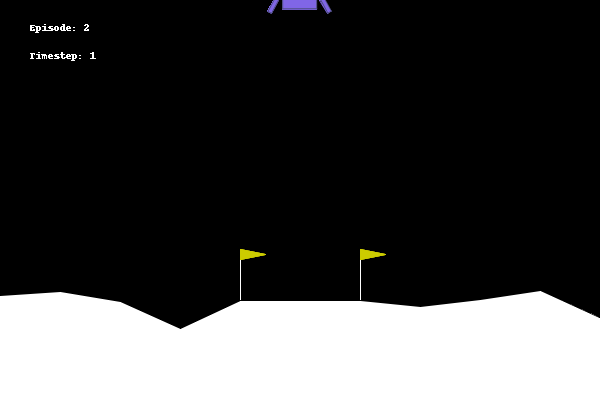

In [93]:
from IPython import display
display.Image(open('/content/drive/MyDrive/Gif/PPO_agent.gif','rb').read())